## Import Liabraries

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

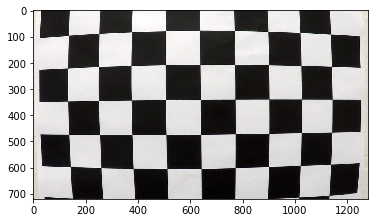

In [2]:
# test image reading
img=mpimg.imread('./camera_cal/calibration1.jpg')
plt.imshow(img)

## Camera Calibration

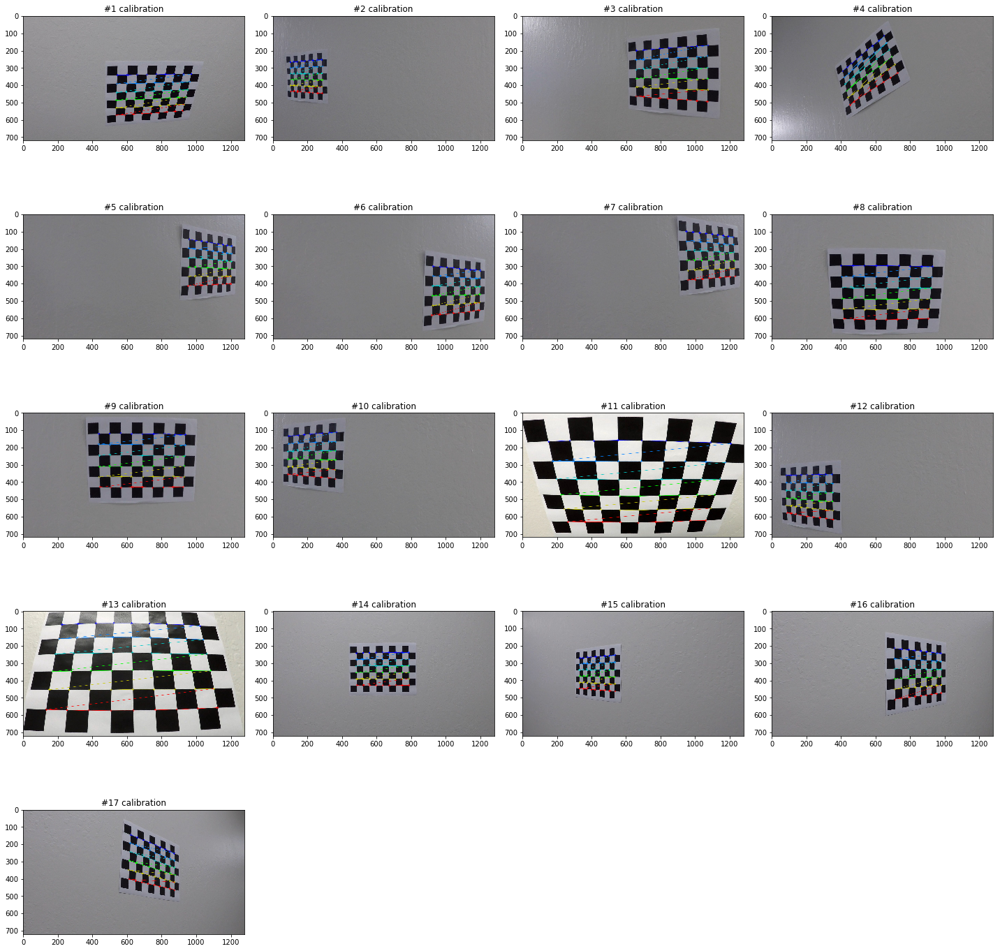

In [3]:
objpoints = [] # 3d points in real world
imgpoints = [] # 2d points in image

#initialize
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# get a list of calibration files and testing files
c_files = glob.glob('./camera_cal/calibration*.jpg')
t_files = glob.glob('./test_images/*.jpg')

corner_images = []

for f in c_files:
    # read image
    img = plt.imread(f)
    
    # convert image to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        corner_images.append(img)

# plot the corners for check
plt.figure(figsize =(20,20))
for i,img in enumerate(corner_images):
    plt.subplot(len(corner_images)//4+1,4,i+1)
    plt.imshow(img)
    plt.title('#{} calibration'.format(i+1))
plt.tight_layout()

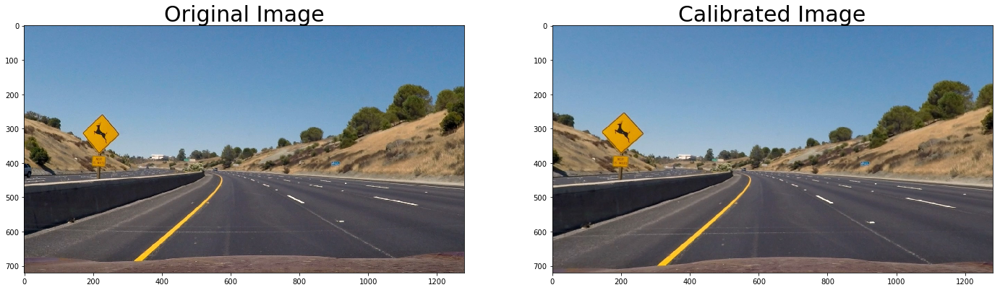

In [4]:
# get the calibration info
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

distorted = []
undistorted = []

# calibrate the testing images
for f in t_files:
    img=plt.imread(f)
    distorted.append(img)
    undistorted.append(cv2.undistort(img,mtx,dist,None,mtx))

# plot for checking
f, (ax1, ax2) = plt.subplots(1,2, figsize=(24,9))
ax1.imshow(distorted[3])
ax1.set_title('Original Image',fontsize=30)
ax2.imshow(undistorted[3])
ax2.set_title('Calibrated Image', fontsize=30)

## Perspective Transformation

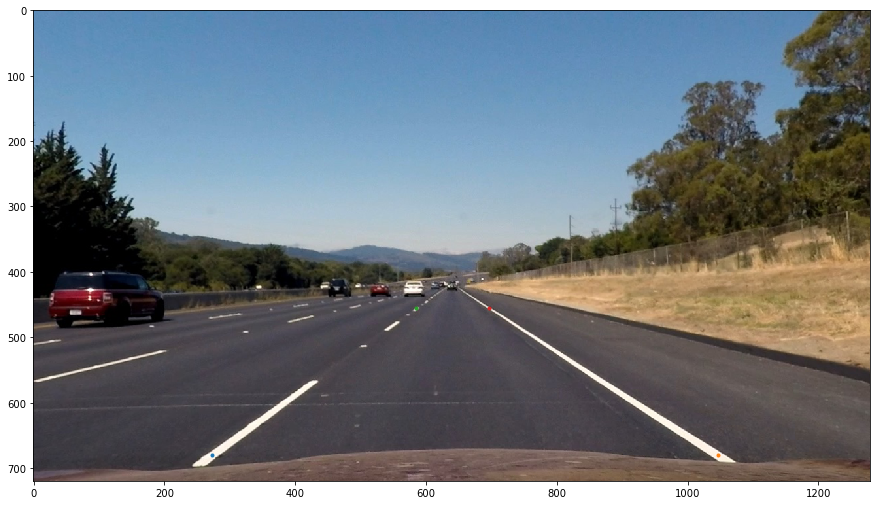

In [5]:
# manually try coords to find the descent ones for perspective transformation

plt.figure(figsize=(15,9))
plt.imshow(undistorted[1])
plt.plot(273,680,'.') # bottom left
plt.plot(1046,680,'.') # bottom right
plt.plot(585,455,'.') # top left
plt.plot(697,455,'.') # top right

In [6]:
src = np.float32(
        [[273,680],
         [1046,680],
         [585,455],
         [697,455]])

dst = np.float32(
        [[300,720],
         [980,720],
         [300,0],
         [980,0]])
# compute the perspective transform M
M = cv2.getPerspectiveTransform(src, dst)

# reverse transform M_r
M_r = cv2.getPerspectiveTransform(dst, src)

def warp(img):
    img_size = (img.shape[1],img.shape[0])    
    # create warped image
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR) 
    return warped

def unwarp(img):
    img_size = (img.shape[1], img.shape[0])
    unwarped = cv2.warpPerspective(img, M_r, img_size, flags=cv2.INTER_LINEAR) 
    return unwarped

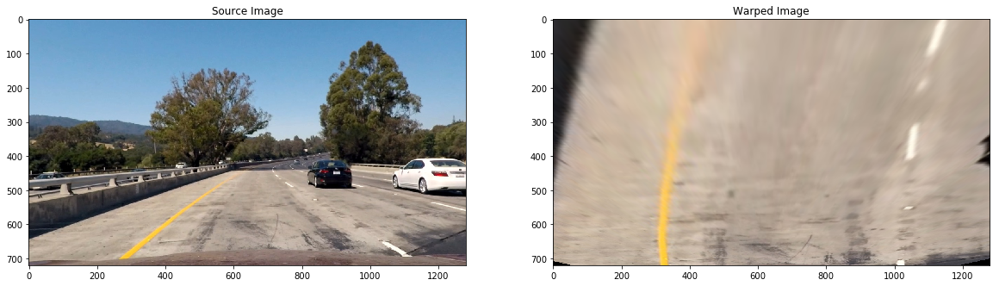

In [7]:
# plot for checking
original = undistorted[2] 
warped_img = warp(original)
f, (ax1,ax2)=plt.subplots(1,2,figsize=(20,10))
ax1.imshow(original)
ax1.set_title('Source Image')
ax2.imshow(warped_img)
ax2.set_title('Warped Image')

## Generate Binary Image with Thresholds

In [8]:
# a function to extract h channel
def extract_h(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    return hls[:,:,0]

# a function to extract l channel
def extract_l(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    return hls[:,:,1]

# a function to extract s channel
def extract_s(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    return hls[:,:,2]

# use s and l channel threshold to generate a binary image
def color_threshold(img):
    s_ch=extract_s(img)
    l_ch=extract_l(img)
    s_min =180
    s_max = 255
    l_max = 253
    l_min = 205
    s_binary = np.zeros_like(s_ch)
    s_binary[((s_ch>=s_min) & (s_ch<=s_max))|((l_ch>=l_min)&(l_ch<=l_max))]=1
    return s_binary
    

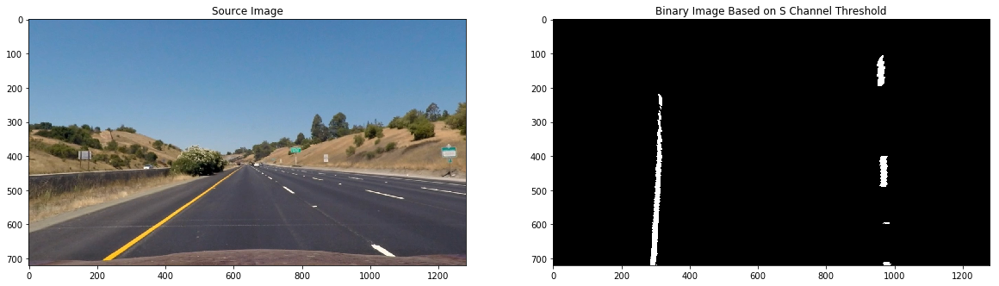

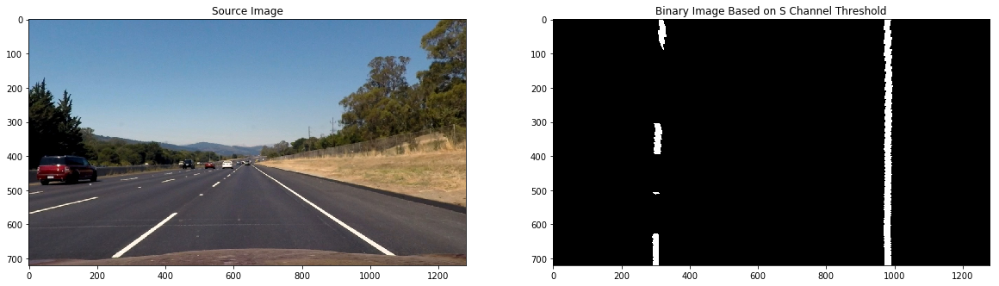

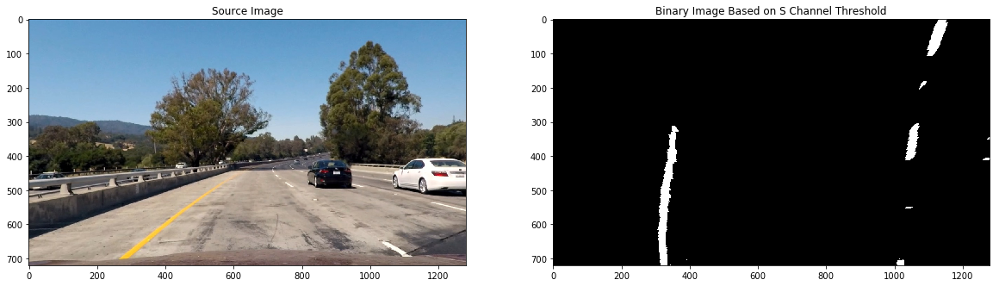

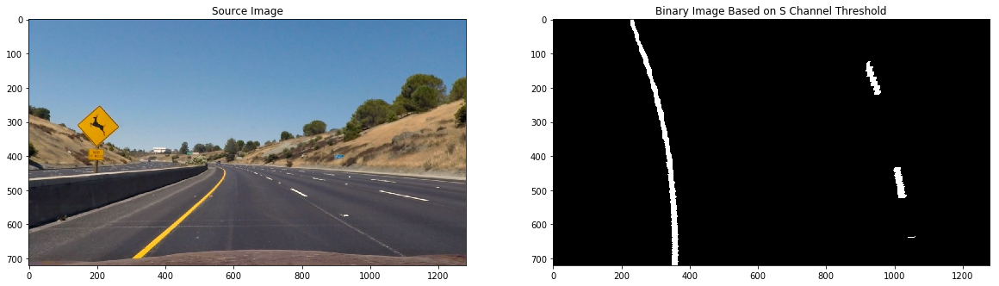

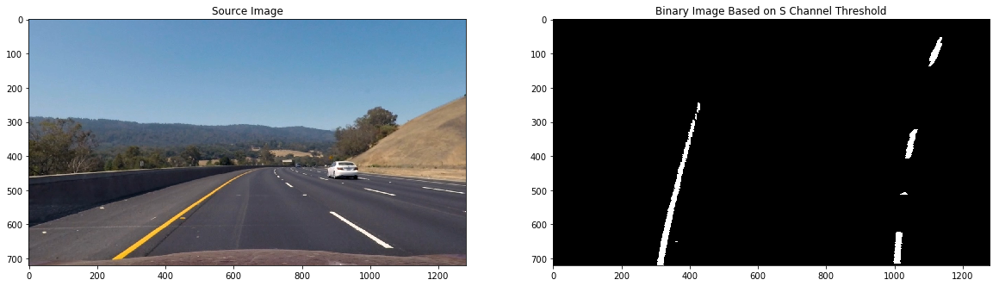

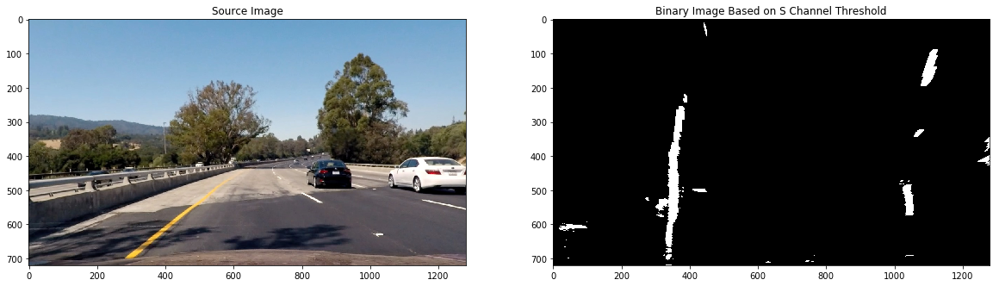

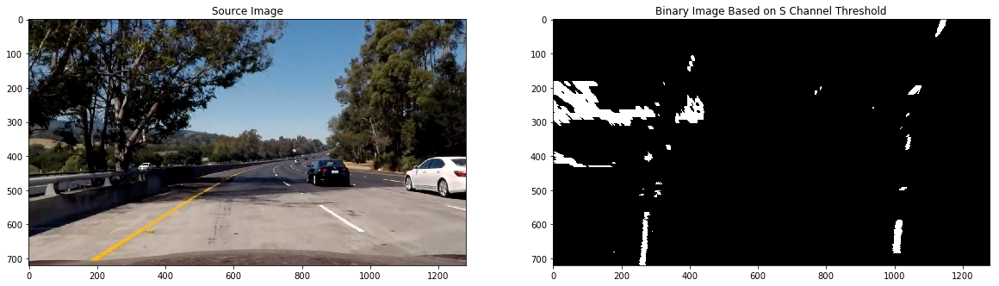

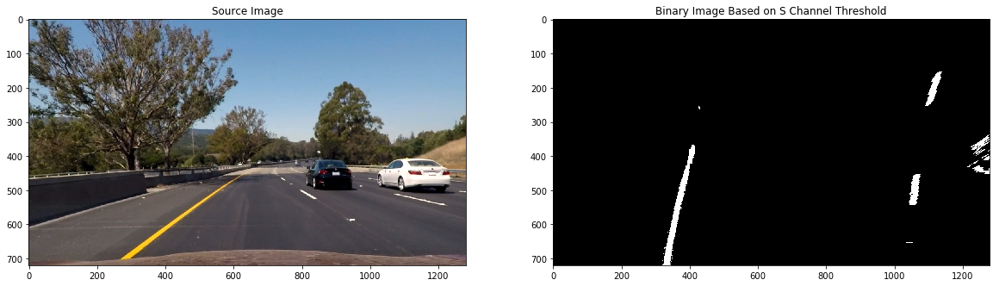

In [9]:
# plot for checking
for img in undistorted:
    hls_line = color_threshold(img)
    f, (ax1, ax2) = plt.subplots(1,2,figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Source Image')
    ax2.imshow(warp(hls_line),cmap='gray')
    ax2.set_title('Binary Image Based on S Channel Threshold')

In [10]:
# define a function to apply a threshold on absolute value of gradient
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, threshold=(0,255)):
    # extract s channel
    s_ch = extract_s(img)
    # calculate absolute gradient
    if orient=='x':
        abs_sobel=np.absolute(cv2.Sobel(s_ch,cv2.CV_64F,1,0, ksize=sobel_kernel))
    if orient=='y':
        abs_sobel=np.absolute(cv2.Sobel(s_ch,cv2.CV_64F,0,1, ksize=sobel_kernel))
    # rescale to 8 bit integer
    scaled_sobel=np.uint8(255*abs_sobel/np.max(abs_sobel))
    # apply the threshold
    grad_binary=np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel>=threshold[0]) & (scaled_sobel <= threshold[1])] = 1
    return grad_binary

# define a function to apply a threshold on magnitude of gradient
def mag_thresh(img, sobel_kernel=3, threshold=(0,255)):
    # extract s channel
    s_ch = extract_s(img)
    # calculate sobel x and y gradients
    sobelx = cv2.Sobel(s_ch, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(s_ch, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # rescale to 8 bit
    scaled_mag = np.uint8(255*gradmag/np.max(gradmag))
    # apply threshold
    mag_binary = np.zeros_like(scaled_mag)
    mag_binary[(scaled_mag >= threshold[0]) & (scaled_mag<=threshold[1])] = 1
    return mag_binary

# define a function to apply a threshold on direction of gradient
def dir_thresh(img, sobel_kernel=3, threshold=(0,255)):
    # extract s channel
    s_ch = extract_s(img)
    # calculate the x and y gradients
    sobelx = cv2.Sobel(s_ch, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(s_ch, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # calculate absolute value of gradient direction
    grad_dir= np.arctan2(np.absolute(sobely),np.absolute(sobelx))
    # apply threshold
    dir_binary = np.zeros_like(grad_dir)
    dir_binary[(grad_dir>=threshold[0]) & (grad_dir<=threshold[1])]=1
    return dir_binary

In [11]:
# combine all gradient thresholds together
def threshold(img,ksize=7):
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, threshold=(30,255))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, threshold=(20,150))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, threshold=(40,200))
    dir_binary = dir_thresh(img, sobel_kernel=ksize, threshold=(0.3,1.3))
    l_ch=extract_l(img)
    l_max = 253
    l_min = 15
    combined = np.zeros_like(dir_binary)
    combined[(((gradx==1) & (grady==1)) | ((mag_binary==1) & (dir_binary==1))) & (l_ch>=l_min) & (l_ch<=l_max)]=1
    return combined

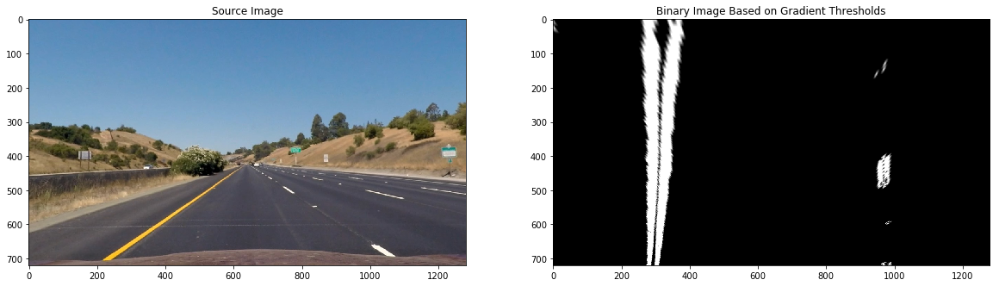

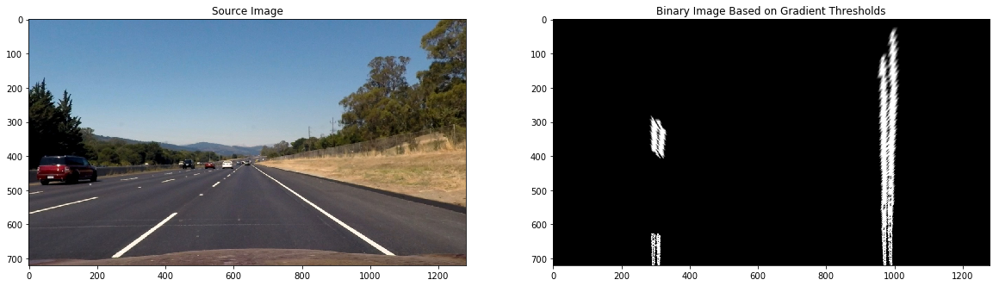

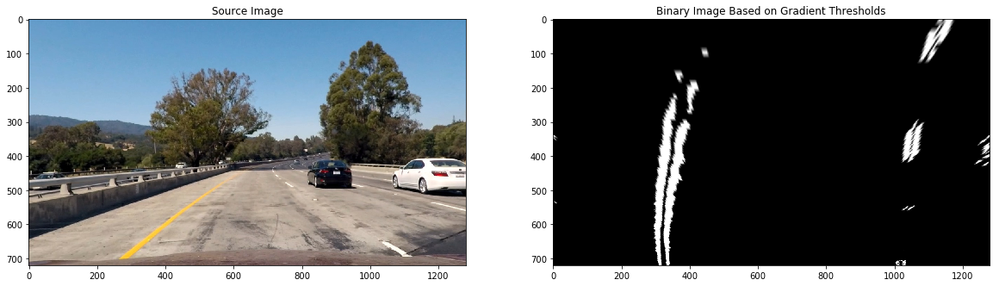

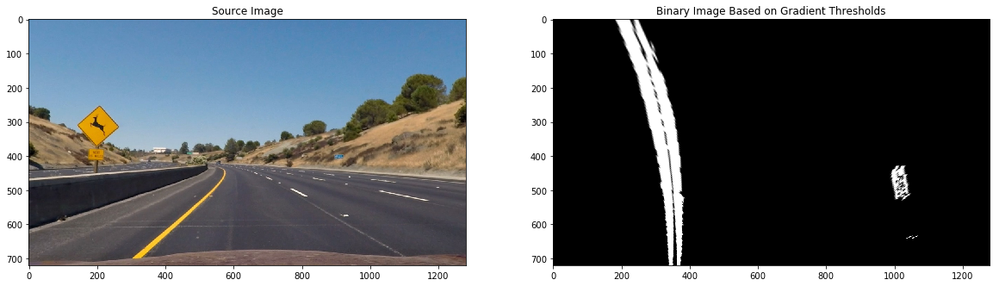

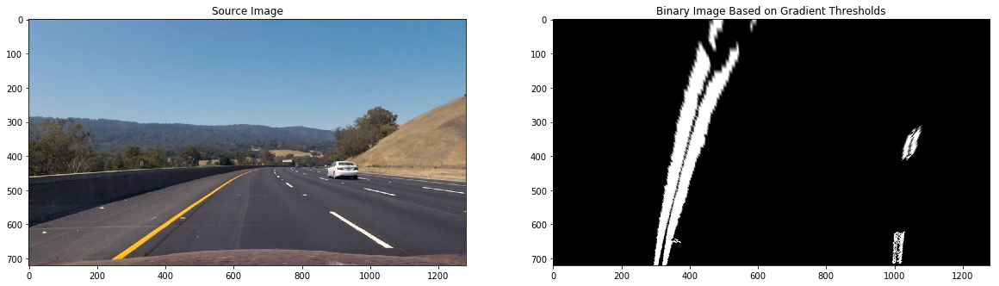

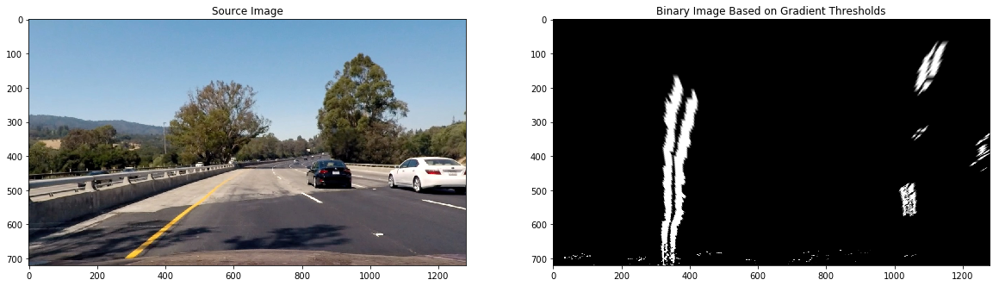

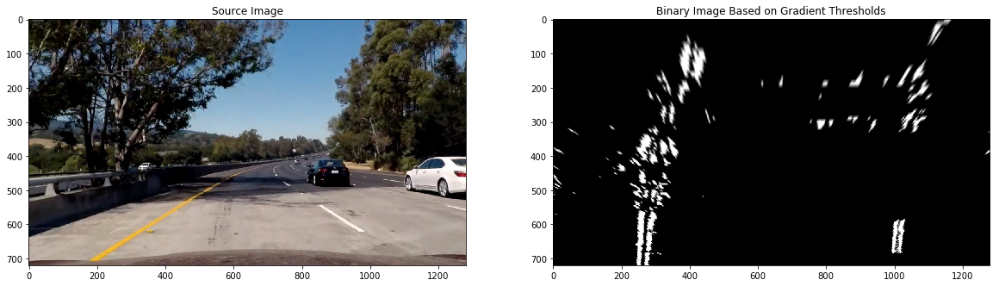

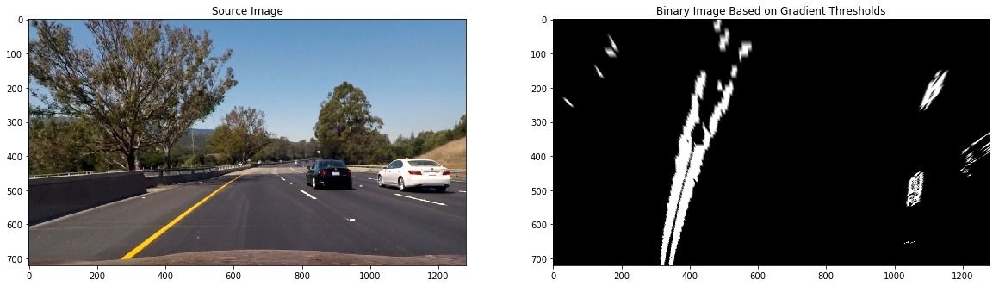

In [12]:
# plot for checking
for img in undistorted:
    original = img
    line=threshold(original)
    f, (ax1, ax2)=plt.subplots(1,2,figsize=(20,10))
    ax1.imshow(original)
    ax1.set_title('Source Image')
    ax2.imshow(warp(line),cmap='gray')
    ax2.set_title('Binary Image Based on Gradient Thresholds')

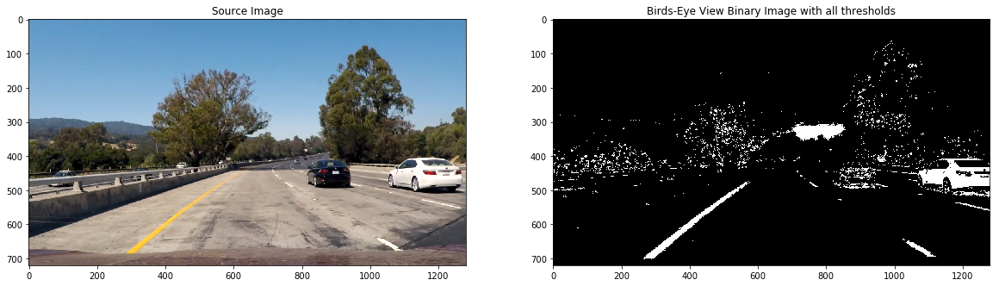

In [13]:
# a function to combine everything above together except warp
def img_process_nowarp(img,ksize=3):
    # correct lens distortion
    img = cv2.undistort(img,mtx,dist,None,mtx)
    # binary image based on an s channel threshold
    s_binary = color_threshold(img)
    # binary image based on gradient thresholds
    grad_binary = threshold(img,ksize=ksize)
    # combine binary images
    combined = np.zeros_like(s_binary)
    combined[(s_binary==1)  | (grad_binary==1)] = 1
    return combined

f, (ax1, ax2)=plt.subplots(1,2,figsize=(20,10))
ax1.imshow(distorted[2])
ax1.set_title('Source Image')
ax2.imshow(img_process_nowarp(distorted[2]),cmap='gray')
ax2.set_title('Birds-Eye View Binary Image with all thresholds')

In [14]:
# a function to combine everything above together
def img_process(img,ksize=3):
    # correct lens distortion
    img = cv2.undistort(img,mtx,dist,None,mtx)
    # binary image based on an s channel threshold
    s_binary = color_threshold(img)
    # binary image based on gradient thresholds
    grad_binary = threshold(img,ksize=ksize)
    # combine binary images
    combined = np.zeros_like(s_binary)
    combined[(s_binary==1)  | (grad_binary==1)] = 1
    # perspective transform
    combined = warp(combined)
    return combined  

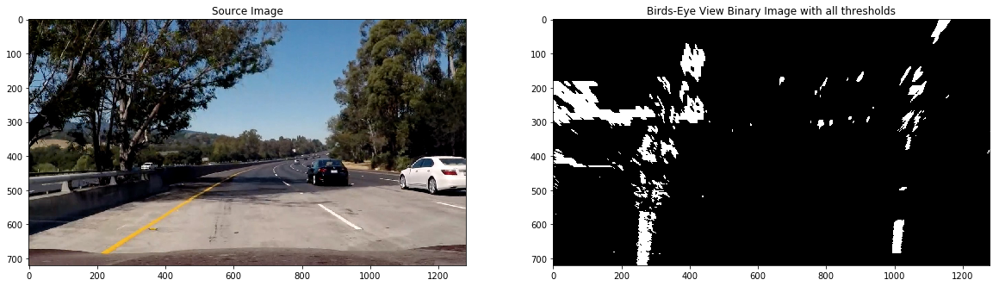

In [15]:
# plot for checking
original = distorted[6]
line=img_process(original,ksize=5)
f, (ax1, ax2)=plt.subplots(1,2,figsize=(20,10))
ax1.imshow(original)
ax1.set_title('Source Image')
ax2.imshow(line,cmap='gray')
ax2.set_title('Birds-Eye View Binary Image with all thresholds')

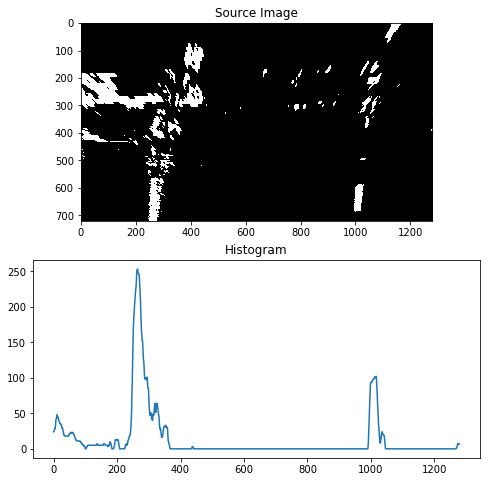

In [16]:
# check histogram
original = distorted[6]
img=img_process(original,ksize=5)
f, (ax1, ax2) = plt.subplots(2,1,figsize=(8,8))
ax1.imshow(img, cmap='gray')
ax1.set_title('Source Image')
histogram = np.sum(img[np.int(img.shape[0]/2):,:],axis=0)
ax2.plot(histogram)
ax2.set_title('Histogram')

## Detect Lane Pixels

[  6.96893797e-04  -7.65524364e-01   4.75046532e+02]
[  4.29863112e-04  -4.71298715e-01   1.13511965e+03]


(720, 0)

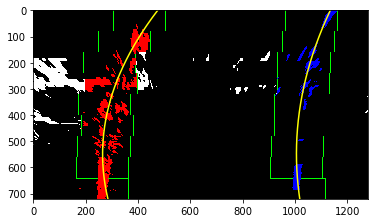

In [17]:
original = distorted[6]
img=img_process(original,ksize=7)

# Take a histogram of the bottom half of the image
histogram = np.sum(img[np.int(img.shape[0]/2):,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((img, img, img))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(img.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = img.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100 # changed from 100
# Set minimum number of pixels found to recenter window
minpix = 50 # changed from 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = img.shape[0] - (window+1)*window_height
    win_y_high = img.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
print(left_fit)
right_fit = np.polyfit(righty, rightx, 2)
print(right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [18]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

y_eval = np.max(ploty)

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')

235.973849993 m 382.243120523 m


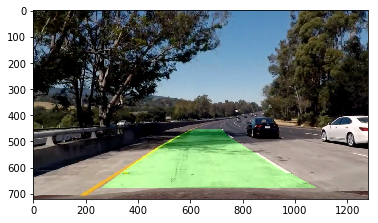

In [19]:
# Create an image to draw the lines on
warp_zero = np.zeros_like(img).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the img blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, M_r, (img.shape[1], img.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(undistorted[6], 1, newwarp, 0.3, 0)
plt.imshow(result)

In [20]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # x values of the most recent fit
        self.current_x = []
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #polynomial coefficients over the last n iterations
        self.recent_fit = []
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
    def fit_new(self, img, base):
        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(img.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        # Current positions to be updated for each window
        x_current = base
        # Set the width of the windows +/- margin
        margin = 75 # changed from 100
        # Set minimum number of pixels found to recenter window
        minpix = 50 # changed from 50
        # Create empty lists to receive lane pixel indices
        lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = img.shape[0] - (window+1)*window_height
            win_y_high = img.shape[0] - window*window_height
            win_x_low = x_current - margin
            win_x_high = x_current + margin 
            # Identify the nonzero pixels in x and y within the window
            good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_x_low) & (nonzerox < win_x_high)).nonzero()[0]
            # Append these indices to the lists
            lane_inds.append(good_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_inds) > minpix:
                x_current = np.int(np.mean(nonzerox[good_inds]))

        # Concatenate the arrays of indices
        lane_inds = np.concatenate(lane_inds)
        
        if len(lane_inds)<100:
            self.detected= False
            self.recent_fit=[]
            return self.best_fit
        
        # Extract line pixel positions
        self.allx = nonzerox[lane_inds]
        self.ally = nonzeroy[lane_inds]
        
        # Fit a second order polynomial to each
        current_fit = np.polyfit(self.ally, self.allx, 2)

        # Generate x and y values for plotting
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
        fitx = current_fit[0]*ploty**2 + current_fit[1]*ploty + current_fit[2]
        
        # sanity check
        if self.sanity_check(img, fitx[-1],current_fit):
            # if pass sanity check, record this fit
            self.detected = True
            self.current_fit = current_fit
            if len(self.recent_fit)>=5:
                del self.recent_fit[0]
            self.recent_fit.append(current_fit)
            if len(self.recent_fit)==3:
                self.best_fit = [x*0.1+y*0.3+z*0.6 for x,y,z in zip(self.recent_fit[0],self.recent_fit[1],self.recent_fit[2])]
            if len(self.recent_fit)==2:
                self.best_fit = [x*0.5+y*0.5 for x,y in zip(self.recent_fit[0],self.recent_fit[1])]
            if len(self.recent_fit)==1:
                self.best_fit=self.recent_fit[0]
        else:
            self.detected = False
            self.recent_fit = []
        return self.best_fit

        
    
    def fit_previous(self, img):
        # Assume you now have a new warped binary image 
        # from the next frame of video (also called "img")
        # It's now much easier to find line pixels!
        nonzero = img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        lane_inds = ((nonzerox > (self.best_fit[0]*(nonzeroy**2) + self.best_fit[1]*nonzeroy + self.best_fit[2] - margin)) & (nonzerox < (self.best_fit[0]*(nonzeroy**2) + self.best_fit[1]*nonzeroy + self.best_fit[2] + margin))) 
        
       
        
        # Again, extract line pixel positions
        self.allx = nonzerox[lane_inds]
        self.ally = nonzeroy[lane_inds] 
        
        # if too few points detected
        if len(self.allx)<100:
            self.detected = False
            self.recent_fit = []
            return self.best_fit
        
        # Fit a second order polynomial to each
        current_fit = np.polyfit(self.ally, self.allx, 2)
        current_fit = np.array(current_fit)
        
        # Generate x and y values for plotting
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
        fitx = current_fit[0]*ploty**2 + current_fit[1]*ploty + current_fit[2]

        # sanity check
        if self.sanity_check(img,fitx[-1],current_fit):
            # if pass sanity check, record this fit
            self.detected = True
            self.current_fit=current_fit
            if len(self.recent_fit)>=3:
                del self.recent_fit[0]
            self.recent_fit.append(current_fit)
            if len(self.recent_fit)==3:
                self.best_fit = [x*0.1+y*0.3+z*0.6 for x,y,z in zip(self.recent_fit[0],self.recent_fit[1],self.recent_fit[2])]
            if len(self.recent_fit)==2:
                self.best_fit = [x*0.4+y*0.6 for x,y in zip(self.recent_fit[0],self.recent_fit[1])]
            if len(self.recent_fit)==1:
                self.best_fit=self.recent_fit[0]
        else:
            self.detected = False
            self.recent_fit = []
        return self.best_fit 
    
    def sanity_check(self, img, boundary, current_fit):
        # check coefficients difference
        if self.detected:
            diff = np.absolute([x-y for x,y in zip(current_fit,self.best_fit)])
            if (diff[0]>0.0005)|(diff[1]>0.5):
                return False
        
        # check distance bettwen vehicle center and detected line
        x_per_pix = 3.7/700 # meters per pixel in x dimension
        img_center = int(img.shape[1]/2)
        dis = np.absolute(boundary - img_center)*x_per_pix
        if ((dis > 4)|(dis<1.5)):
            return False
        else:
            self.line_base_pos = dis
        
        # check curvature
        curv = self.curvature()
        if ((curv>11000)|( curv<200)):
            return False
        else:
            self.radius_of_curvature= curv
        return True
        
        
    def curvature(self):
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        y_eval = np.max(ploty)
        y=self.ally
        x=self.allx
        # Fit new polynomials to x,y in world space
        fit_cr = np.polyfit(y*ym_per_pix, x*xm_per_pix, 2)
        # Calculate the new radii of curvature
        curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
        return curverad

    
    def draw_measurement(self, img, pos1, pos2):
        text1 = '{}{:+6.1f}{}'.format("Curvature: ", self.radius_of_curvature, " m")
        img = cv2.putText(img, text1, pos1, fontFace=cv2.FONT_HERSHEY_COMPLEX,
                           fontScale=1, color=(255, 255, 255), thickness=2)
    
        text2 = ' '
        if self.line_base_pos==left_lane.line_base_pos:
            offset = self.line_base_pos - right_lane.line_base_pos
            text2 = '{}{:+3.2f}{}'.format("Center offset: ", offset, " m")
        return cv2.putText(img, text2, pos2, fontFace=cv2.FONT_HERSHEY_COMPLEX,
                           fontScale=1, color=(255, 255, 255), thickness=2)

In [21]:
def lane_detect(img):
    # generate binary image based with thresholds and then warp it
    binary= img_process(img,ksize=5)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary[np.int(binary.shape[0]/2):,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    if left_lane.detected:
        left_fit = left_lane.fit_previous(binary) # use last detected line for fitting
    else:
        left_fit = left_lane.fit_new(binary, leftx_base) # use sliding window for fitting
        
    if right_lane.detected:
        right_fit = right_lane.fit_previous(binary) # use last detected line for fitting
    else:
        right_fit = right_lane.fit_new(binary, rightx_base) # use sliding window for fitting
    
    if (left_fit is not None) and (right_fit is not None):
        # generate points for plot
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    else:
        ploty = []
        left_fitx = []
        right_fitx = []
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_r, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    if (left_fit is not None) and (right_fit is not None):
        result = left_lane.draw_measurement(result,pos1=(140, 50),pos2=(140,100))
        result = right_lane.draw_measurement(result, pos1=(740,50),pos2=(740,100))
    return result

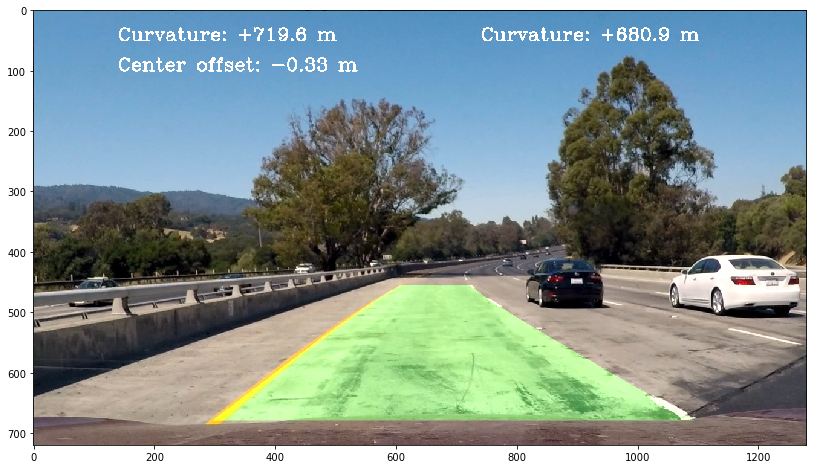

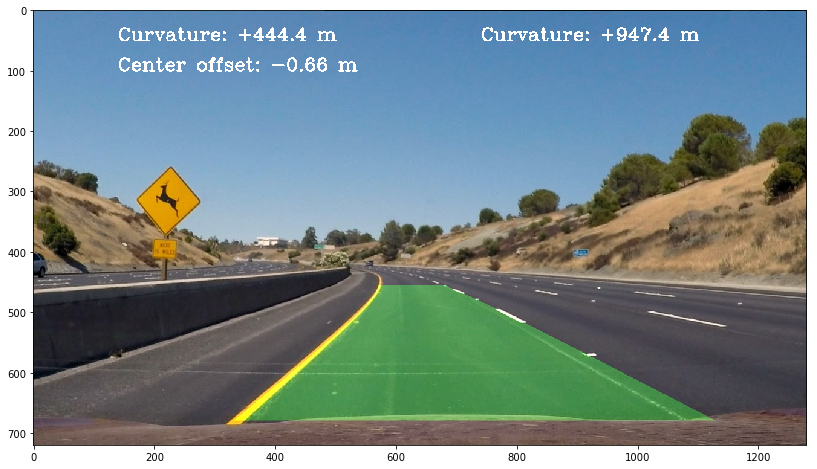

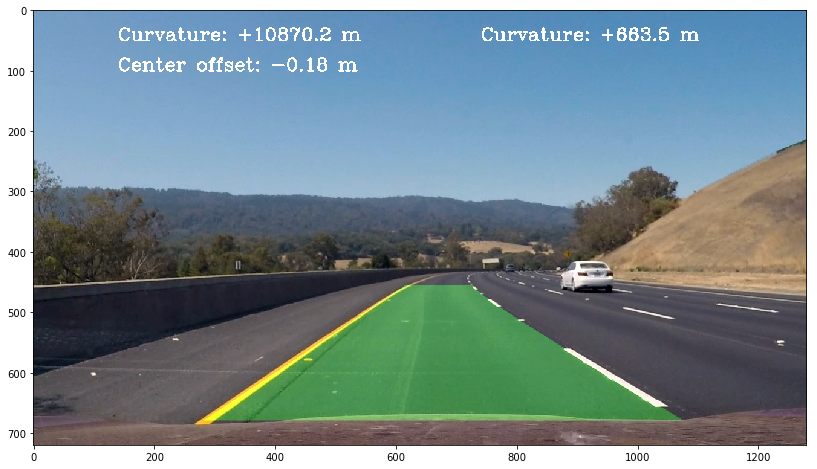

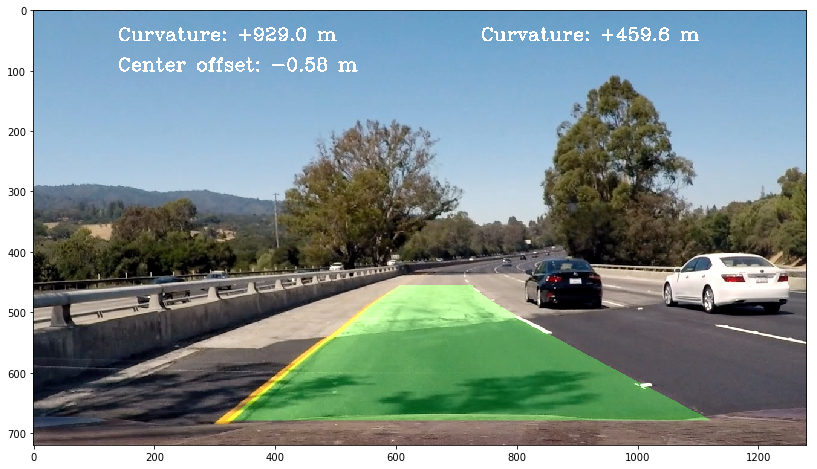

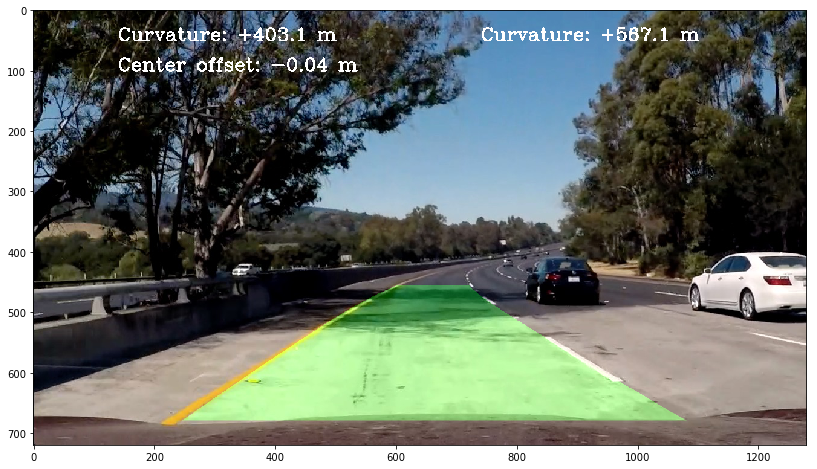

In [22]:
for img in distorted[2:7]:
    left_lane=Line()
    right_lane=Line()
    plt.figure(figsize=(16,8))
    plt.imshow(lane_detect(img))

In [ ]:
left_lane = Line()
right_lane = Line()
output = 'project_video_output.mp4'
lane_in = VideoFileClip("project_video.mp4")
clip_out = lane_in.fl_image(lane_detect) #NOTE: this function expects color images!!
%time clip_out.write_videofile(output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))